In [17]:
from google.colab import drive
def mount():
  drive.mount('/content/gdrive')
mount()

Mounted at /content/gdrive


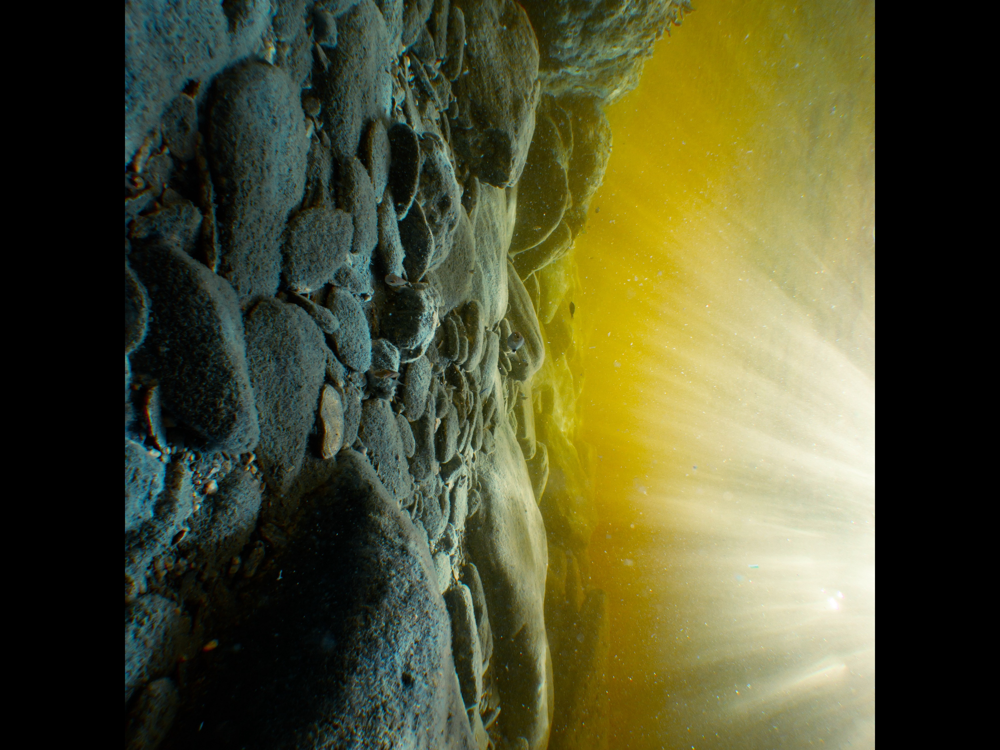

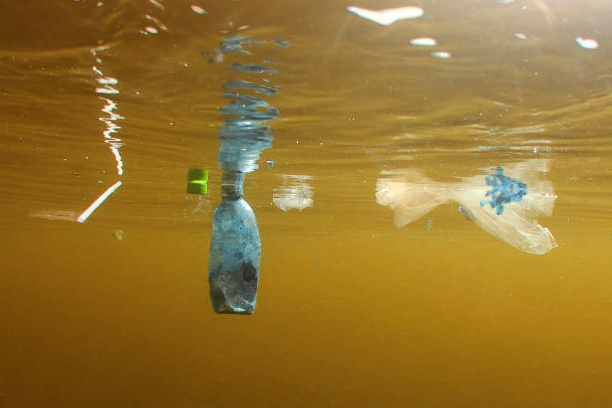

In [3]:
import cv2
from google.colab.patches import cv2_imshow
no_plasic_img= cv2.imread('/content/gdrive/MyDrive/kaggle_dataset/dataset/SOUVIK/test/no-plastic/no_plasic (1030).jpg')
cv2_imshow(no_plasic_img)
plastic_img= cv2.imread('/content/gdrive/MyDrive/kaggle_dataset/dataset/SOUVIK/test/plastic/plastic (1000).jpg')
cv2_imshow(plastic_img)


In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import cv2
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tqdm import tqdm
import keras
import os
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Input, Conv2D, Activation,MaxPool2D, AveragePooling2D, Flatten, GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.layers import Concatenate
from tensorflow.keras.models import Model
from keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, TensorBoard, ModelCheckpoint
from sklearn.metrics import classification_report,confusion_matrix
import ipywidgets as widgets
import io
from PIL import Image
from IPython.display import display,clear_output
import time

In [2]:
labels = ['no-plastic','plastic']

In [5]:
X_train = []
y_train = []
image_size = 224
for i in labels:
    folderPath = '/content/gdrive/MyDrive/kaggle_dataset/dataset/SOUVIK/train/'+i
    for j in (os.listdir(folderPath)):
        img = cv2.imread(os.path.join(folderPath,j))
        img = cv2.resize(img,(image_size, image_size))
        X_train.append(img)
        y_train.append(i)

for i in labels:
    folderPath = '/content/gdrive/MyDrive/kaggle_dataset/dataset/SOUVIK/test/'+i
    for j in (os.listdir(folderPath)):
        img = cv2.imread(os.path.join(folderPath,j))
        img = cv2.resize(img,(image_size,image_size))
        X_train.append(img)
        y_train.append(i)

X_train = np.array(X_train)
y_train = np.array(y_train)

In [6]:
X_train, y_train = shuffle(X_train,y_train, random_state=101)

In [7]:
X_train.shape


(2150, 224, 224, 3)

In [8]:
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True)

datagen.fit(X_train)
X_train.shape

(2150, 224, 224, 3)

In [9]:
X_train,X_test,y_train,y_test = train_test_split(X_train,y_train, test_size=0.1,random_state=101)


In [10]:
y_train_new = []
for i in y_train:
    y_train_new.append(labels.index(i))
y_train = y_train_new
y_train = tf.keras.utils.to_categorical(y_train)


y_test_new = []
for i in y_test:
    y_test_new.append(labels.index(i))
y_test = y_test_new
y_test = tf.keras.utils.to_categorical(y_test)

In [11]:
model = Sequential()
model.add(Conv2D(input_shape=(224,224,3),filters=6,kernel_size=(5,5),padding="same", activation="relu"))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
model.add(Conv2D(filters=16,kernel_size=(5,5),padding="same", activation="relu"))
#model.add(Activation('relu'))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
model.add(Conv2D(filters=64, kernel_size=(3,3), activation="relu"))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
# model.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", activation="relu"))
# model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))

model.add(Flatten())
# model.add(Dense(units=128,activation="relu"))
model.add(Dense(units=128,activation="relu"))
model.add(Dropout(0.5))
model.add(Dense(units=2, activation="softmax"))

In [12]:
# prompt:  optimis the  hyperparamètres of the model in the previous cell during training
# from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
# es = EarlyStopping(monitor = 'val_loss',
#                    min_delta = 0,
#                    patience = 15,
#                    verbose = 1,
#                    restore_best_weights = True)

# checkpoint = ModelCheckpoint(filepath = '/content/gdrive/MyDrive/kaggle_dataset/cnnmodel.h5',
#                              monitor = 'val_loss',
#                              mode ='min',
#                              save_best_only = True,
#                              verbose = 1)

# callbacks = [es, checkpoint]
early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1, mode='min')
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=0.0001, verbose=1)
model_checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, verbose=1)
# model.compile(optimizer = 'adam', loss = keras.losses.binary_crossentropy, metrics = ['accuracy'])
# r=model.fit(X_train,y_train,validation_split=0.1, epochs = 100,steps_per_epoch=12, verbose=1, batch_size=30,callbacks=callbacks)

In [13]:
# prompt: train the model on the dataset

model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

history = model.fit(datagen.flow(X_train,y_train, batch_size=32),
                    epochs=50,
                    validation_data=(X_test,y_test),
                    callbacks=[early_stopping, reduce_lr, model_checkpoint])


Epoch 1/50
61/61 [==============================] - ETA: 0s - loss: 28.0742 - accuracy: 0.5664
Epoch 1: val_loss improved from inf to 0.59303, saving model to best_model.h5
61/61 [==============================] - 121s 2s/step - loss: 28.0742 - accuracy: 0.5664 - val_loss: 0.5930 - val_accuracy: 0.6977 - lr: 0.0010
Epoch 2/50


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


61/61 [==============================] - ETA: 0s - loss: 0.5742 - accuracy: 0.7168
Epoch 2: val_loss improved from 0.59303 to 0.53360, saving model to best_model.h5
61/61 [==============================] - 124s 2s/step - loss: 0.5742 - accuracy: 0.7168 - val_loss: 0.5336 - val_accuracy: 0.7628 - lr: 0.0010
Epoch 3/50
61/61 [==============================] - ETA: 0s - loss: 0.5250 - accuracy: 0.7566
Epoch 3: val_loss improved from 0.53360 to 0.43078, saving model to best_model.h5
61/61 [==============================] - 118s 2s/step - loss: 0.5250 - accuracy: 0.7566 - val_loss: 0.4308 - val_accuracy: 0.7953 - lr: 0.0010
Epoch 4/50
61/61 [==============================] - ETA: 0s - loss: 0.5363 - accuracy: 0.7266
Epoch 4: val_loss did not improve from 0.43078
61/61 [==============================] - 115s 2s/step - loss: 0.5363 - accuracy: 0.7266 - val_loss: 0.4484 - val_accuracy: 0.7395 - lr: 0.0010
Epoch 5/50
61/61 [==============================] - ETA: 0s - loss: 0.5014 - accuracy: 0.

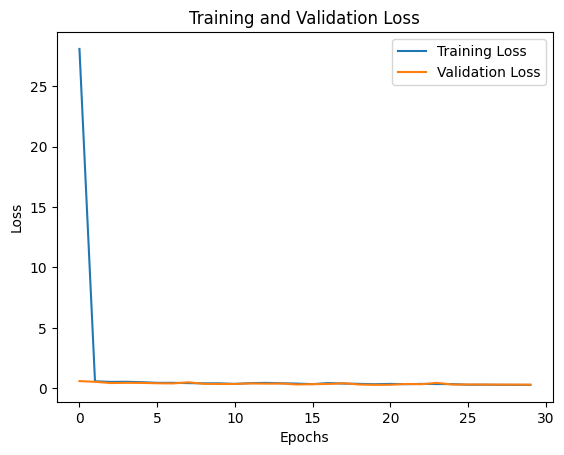

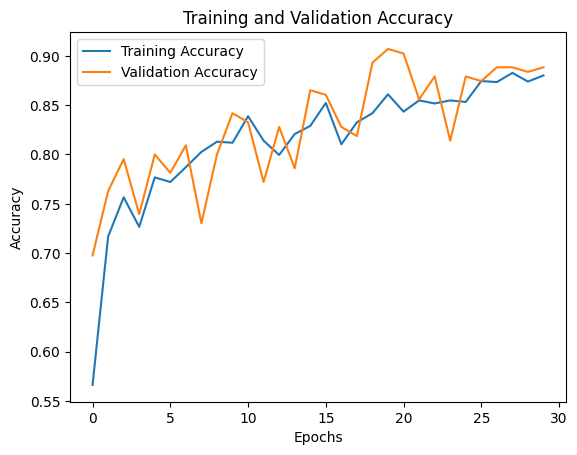

In [14]:
# prompt: visualise result of loss and accuracy

import matplotlib.pyplot as plt
# Plot the training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot the training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


In [15]:
train_dir =  '/content/gdrive/MyDrive/kaggle_dataset/dataset/SOUVIK/train/'
test_dir = '/content/gdrive/MyDrive/kaggle_dataset/dataset/SOUVIK/test/'

In [18]:
import tensorflow as tf

train_data = tf.keras.preprocessing.image_dataset_from_directory(train_dir,
                                                                 image_size=(224,224),
                                                                 label_mode = "categorical",
                                                                 batch_size = 32
                                                                 )
test_data =tf.keras.preprocessing.image_dataset_from_directory(test_dir,
                                                               image_size =(224,224),
                                                               label_mode = "categorical",
                                                               batch_size = 32
                                                               )

Found 1720 files belonging to 2 classes.
Found 430 files belonging to 2 classes.


In [19]:
pred = model.predict(X_test)
pred = np.argmax(pred,axis=1)
y_test_new = np.argmax(y_test,axis=1)

7/7 [==============================] - 3s 408ms/step


In [20]:
print(classification_report(y_test_new,pred))

              precision    recall  f1-score   support

           0       0.85      0.93      0.89       100
           1       0.93      0.85      0.89       115

    accuracy                           0.89       215
   macro avg       0.89      0.89      0.89       215
weighted avg       0.89      0.89      0.89       215



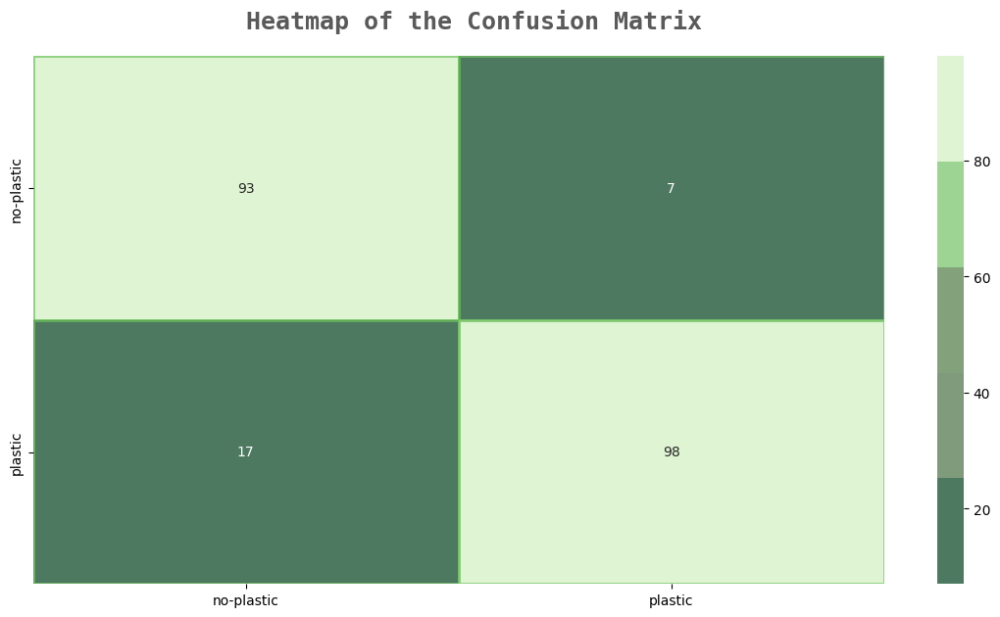

In [21]:
colors_dark = ["#1F1F1F", "#313131", '#636363', '#AEAEAE', '#DADADA']
colors_red = ["#331313", "#582626", '#9E1717', '#D35151', '#E9B4B4']
colors_green = ['#01411C','#4B6F44','#4F7942','#74C365','#D0F0C0']



fig,ax=plt.subplots(1,1,figsize=(14,7))
sns.heatmap(confusion_matrix(y_test_new,pred),ax=ax,xticklabels=labels,yticklabels=labels,annot=True,
           cmap=colors_green[::1],alpha=0.7,linewidths=2,linecolor=colors_green[3])
fig.text(s='Heatmap of the Confusion Matrix',size=18,fontweight='bold',
             fontname='monospace',color=colors_dark[1],y=0.92,x=0.28,alpha=0.8)

plt.show()